# Overview
This python project aims at exploring the features which impact the price of listing property in Sydney Airbnb.
The quarterly Sydney Airbnb data extracted from Airbnb official web (http://insideairbnb.com/get-the-data/) starts from 06,June 2021 to 06,June 2022.
The analysis will be conducted as following steps:
1. Examine the data quality
2. Identify the listing room types.
3. Explore the features (Room type,average book nights, average price, location, reviews, license, instant_bookable,host information)
based on step 1's outcome.
4. Get the impact features for the high review rating property.


In [1]:
#Imports
#utf-8
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# data import
df_list_sum = pd.read_csv('listingsSummary.csv',encoding='latin1', converters={"id": str})
df_list = pd.read_csv('listings.csv',encoding='latin1', converters={"id": str})
df_calendar = pd.read_csv('calendar.csv',encoding='latin1', converters={"id": str})

In [3]:
df_list_sum.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,11156,An Oasis in the City,40855,Colleen,NaN,Sydney,-33.86767,151.22497,Private room,65,90,195,13/03/2020,1.28,1,364,0,NaN
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.80084,151.26378,Entire home/apt,470,2,3,1/06/2021,0.04,2,66,0,Exempt
2,15253,Unique Designer Rooftop Apartment in City Loca...,59850,Morag,NaN,Sydney,-33.87964,151.2168,Private room,79,2,414,2/06/2022,3.31,1,258,40,PID-STRA-24061-7
3,44545,Sunny Darlinghurst Warehouse Apartment,112237,Atari,NaN,Sydney,-33.87888,151.21439,Entire home/apt,130,90,76,3/01/2020,0.54,1,0,0,NaN
4,58506,"Studio Yindi @ Mosman, Sydney",279955,John,NaN,Mosman,-33.81748,151.23484,Entire home/apt,150,2,331,1/06/2022,2.38,1,204,44,PID-STRA-2810
5,61721,"2br Eclectic Stylish Home, 2 mins to Bondi Beach",299170,Eilish,NaN,Waverley,-33.88905,151.27653,Entire home/apt,245,90,33,7/04/2021,0.24,1,364,0,NaN
6,67112,Quiet base to explore Sydney,160705,Liz,NaN,Marrickville,-33.91353,151.13982,Private room,75,90,23,17/12/2019,0.17,1,363,0,NaN
7,68999,A little bit of Sydney - Australia,333581,Bryan,NaN,Hornsby,-33.72966,151.05226,Private room,89,1,75,16/05/2022,0.56,1,340,15,PID-STRA-9081
8,71866,A Jewel Amongst Greenery,292913,Marzena,NaN,Randwick,-33.9086,151.25185,Entire home/apt,188,3,8,5/04/2021,0.08,4,193,0,PID-STRA-23689
9,75702,Beachside haven with gorgeous sea & Headland v...,402292,Helen,NaN,Randwick,-33.96643,151.24885,Entire home/apt,122,3,305,22/05/2022,2.24,2,10,7,PID-STRA-4737


In [4]:
# check data type
df_list_sum.info() #20632


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20486 entries, 0 to 20485
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   id                              20486 non-null  object
 1   name                            20479 non-null  object
 2   host_id                         20485 non-null  object
 3   host_name                       20286 non-null  object
 4   neighbourhood_group             264 non-null    object
 5   neighbourhood                   20474 non-null  object
 6   latitude                        20481 non-null  object
 7   longitude                       20486 non-null  object
 8   room_type                       20485 non-null  object
 9   price                           20486 non-null  object
 10  minimum_nights                  20480 non-null  object
 11  number_of_reviews               20392 non-null  object
 12  last_review                     15212 non-null

In [12]:
df_list_sum.price = df_list_sum.price.astype('float')

C:\Users\87636\AppData\Roaming\Python\Python38\site-packages\pandas\core\generic.py:5165: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [21]:
columns=['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [23]:
numericcol = ['latitude', 'longitude',
       'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm']
df_list_sum[numericcol] = df_list_sum[numericcol].apply(pd.to_numeric)

C:\Users\87636\AppData\Roaming\Python\Python38\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [5]:
# check null values
pd.set_option('display.max_rows', None)
df_list_sum.isnull().sum().sort_values(ascending=False)

neighbourhood_group               20222
license                           12148
last_review                        5274
reviews_per_month                  5189
host_name                           200
number_of_reviews_ltm               193
number_of_reviews                    94
availability_365                     15
neighbourhood                        12
name                                  7
minimum_nights                        6
calculated_host_listings_count        5
latitude                              5
host_id                               1
room_type                             1
longitude                             0
price                                 0
id                                    0
dtype: int64

In [6]:
#clean up room tpype
df_list_sum.room_type.unique()
RoomType = ['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']
df_list_sum = df_list_sum[df_list_sum['room_type'].isin(RoomType)]
df_list_sum

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,11156,An Oasis in the City,40855,Colleen,NaN,Sydney,-33.86767,151.22497,Private room,65,90,195,13/03/2020,1.28,1,364,0,NaN
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.80084,151.26378,Entire home/apt,470,2,3,1/06/2021,0.04,2,66,0,Exempt
2,15253,Unique Designer Rooftop Apartment in City Loca...,59850,Morag,NaN,Sydney,-33.87964,151.2168,Private room,79,2,414,2/06/2022,3.31,1,258,40,PID-STRA-24061-7
3,44545,Sunny Darlinghurst Warehouse Apartment,112237,Atari,NaN,Sydney,-33.87888,151.21439,Entire home/apt,130,90,76,3/01/2020,0.54,1,0,0,NaN
4,58506,"Studio Yindi @ Mosman, Sydney",279955,John,NaN,Mosman,-33.81748,151.23484,Entire home/apt,150,2,331,1/06/2022,2.38,1,204,44,PID-STRA-2810
5,61721,"2br Eclectic Stylish Home, 2 mins to Bondi Beach",299170,Eilish,NaN,Waverley,-33.88905,151.27653,Entire home/apt,245,90,33,7/04/2021,0.24,1,364,0,NaN
6,67112,Quiet base to explore Sydney,160705,Liz,NaN,Marrickville,-33.91353,151.13982,Private room,75,90,23,17/12/2019,0.17,1,363,0,NaN
7,68999,A little bit of Sydney - Australia,333581,Bryan,NaN,Hornsby,-33.72966,151.05226,Private room,89,1,75,16/05/2022,0.56,1,340,15,PID-STRA-9081
8,71866,A Jewel Amongst Greenery,292913,Marzena,NaN,Randwick,-33.9086,151.25185,Entire home/apt,188,3,8,5/04/2021,0.08,4,193,0,PID-STRA-23689
9,75702,Beachside haven with gorgeous sea & Headland v...,402292,Helen,NaN,Randwick,-33.96643,151.24885,Entire home/apt,122,3,305,22/05/2022,2.24,2,10,7,PID-STRA-4737


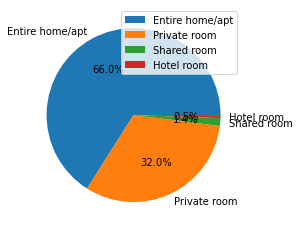

ValueError: zero-size array to reduction operation fmin which has no identity

In [7]:
# define room type
plt.pie(df_list_sum.room_type.value_counts(),labels=df_list_sum.room_type.value_counts().index,autopct='%1.1f%%')
plt.legend()
plt.show()
df_list_sum_corr = pd.DataFrame.corr(df_list_sum)
ax = sns.heatmap(df_list_sum_corr,annot=True,fmt='.4g')
plt.show()

## Findings :The percentage of room type "hotel room" and "shared room" has 1.9% in total so we dont analysis these two type of rooms
## The analysis will mainly foucos on room type "entire home/apt" and "private room"

In [10]:
df_list_sum = df_list_sum[df_list_sum['room_type'].isin(['Private room', 'Entire home/apt'])]
df_list_sum.head()# 19818

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,11156,An Oasis in the City,40855,Colleen,NaN,Sydney,-33.86767,151.22497,Private room,65,90,195,13/03/2020,1.28,1,364,0,NaN
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.80084,151.26378,Entire home/apt,470,2,3,1/06/2021,0.04,2,66,0,Exempt
2,15253,Unique Designer Rooftop Apartment in City Loca...,59850,Morag,NaN,Sydney,-33.87964,151.2168,Private room,79,2,414,2/06/2022,3.31,1,258,40,PID-STRA-24061-7
3,44545,Sunny Darlinghurst Warehouse Apartment,112237,Atari,NaN,Sydney,-33.87888,151.21439,Entire home/apt,130,90,76,3/01/2020,0.54,1,0,0,NaN
4,58506,"Studio Yindi @ Mosman, Sydney",279955,John,NaN,Mosman,-33.81748,151.23484,Entire home/apt,150,2,331,1/06/2022,2.38,1,204,44,PID-STRA-2810


## examine room type "Private room" price distribution

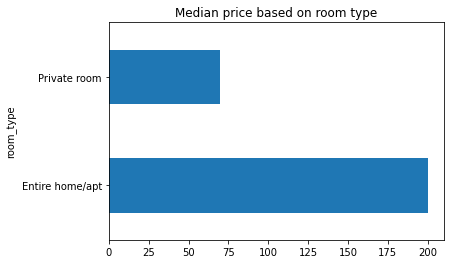

In [16]:

pri_room_gb_price = df_list_sum.groupby('room_type').price.agg('median').plot.barh()
plt.title('Median price based on room type')
plt.show()

# Output:The room type is signicifantly impacating the listing price

# Price distribution based on room_type

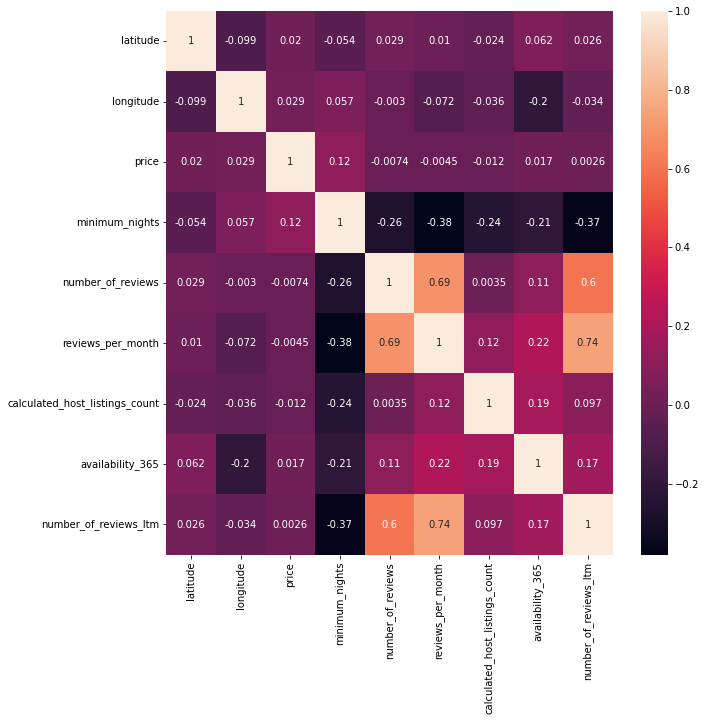

In [27]:
# "private room" price correlation
plt.figure(figsize=(10,10))
df_list_sum_pri_room = df_list_sum[df_list_sum['room_type']=='Private room']
pri_room_price_corr = pd.DataFrame.corr(df_list_sum_pri_room)
sns.heatmap(pri_room_price_corr,annot=True,fmt='.2g')
plt.show()

# For roomtype == private room within the numeric features:
# Output: the min nights has impact on the price compared to other numerical features

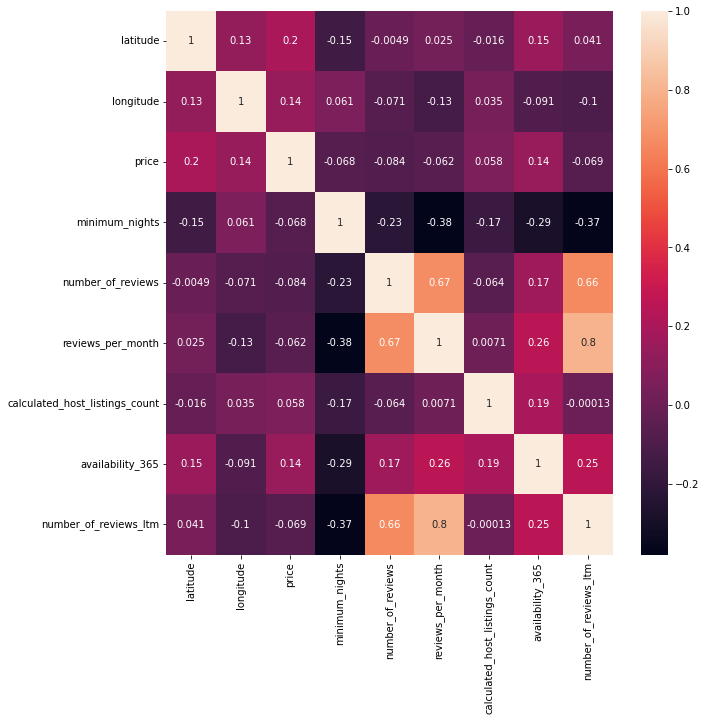

In [28]:
plt.figure(figsize=(10,10))
df_list_sum_pri_room = df_list_sum[df_list_sum['room_type']=='Entire home/apt']
pri_room_price_corr = pd.DataFrame.corr(df_list_sum_pri_room)
sns.heatmap(pri_room_price_corr,annot=True,fmt='.2g')
plt.show()


# For roomtype == entire house/apt within the numeric features:
# Findings "reviews_per_month" and "min_nights" have high correlation
# Output:the "longtitue" and "lat" have higher corr than other numeric futures which means location impact the price

